In [1]:
import os

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import poisson

from graspy.embed import OmnibusEmbed, selectSVD
from graspy.models import DCSBMEstimator, SBMEstimator
from graspy.utils import (
    augment_diagonal,
    binarize,
    pass_to_ranks,
    remove_loops,
    to_laplace,
)
from src.cluster import BinaryCluster
from src.data import load_metagraph
from src.graph import MetaGraph
from src.hierarchy import signal_flow
from src.io import savecsv, savefig
from src.utils import get_paired_inds
from src.visualization import (
    CLASS_COLOR_DICT,
    add_connections,
    adjplot,
    plot_color_labels,
    plot_double_dendrogram,
    plot_single_dendrogram,
)

from sklearn.datasets import load_digits
from sklearn.decomposition import FastICA

In [2]:
rc_dict = {
    "axes.spines.right": False,
    "axes.spines.top": False,
    "axes.formatter.limits": (-3, 3),
    "figure.figsize": (6, 3),
    "figure.dpi": 100,
    "axes.edgecolor": "lightgrey",
    "ytick.color": "grey",
    "xtick.color": "grey",
    "axes.labelcolor": "dimgrey",
    "text.color": "dimgrey",
}
for key, val in rc_dict.items():
    mpl.rcParams[key] = val
context = sns.plotting_context(context="talk", font_scale=1, rc=rc_dict)
sns.set_context(context)

np.random.seed(8888)

In [3]:
def plot_pairs(
    X, labels, model=None, left_pair_inds=None, right_pair_inds=None, equal=False
):

    n_dims = X.shape[1]

    fig, axs = plt.subplots(
        n_dims, n_dims, sharex=False, sharey=False, figsize=(20, 20)
    )
    data = pd.DataFrame(data=X)
    data["label"] = labels

    for i in range(n_dims):
        for j in range(n_dims):
            ax = axs[i, j]
            ax.axis("off")
            if i < j:
                sns.scatterplot(
                    data=data,
                    x=j,
                    y=i,
                    ax=ax,
                    alpha=0.7,
                    linewidth=0,
                    s=8,
                    legend=False,
                    hue="label",
                    palette=CLASS_COLOR_DICT,
                )
                if left_pair_inds is not None and right_pair_inds is not None:
                    add_connections(
                        data.iloc[left_pair_inds, j],
                        data.iloc[right_pair_inds, j],
                        data.iloc[left_pair_inds, i],
                        data.iloc[right_pair_inds, i],
                        ax=ax,
                    )

    plt.tight_layout()
    return fig, axs

In [4]:
def preprocess_adjs(adjs):

    adjs = [pass_to_ranks(a) for a in adjs]
    adjs = [a + 1 / a.size for a in adjs]

    return adjs

In [5]:
def get_omni_matrix(graphs):

    shape = graphs[0].shape
    n = shape[0]  
    m = len(graphs)  

    A = np.array(graphs, copy=False, ndmin=3)

    out = (A[:, :, None, :] + A.transpose(1, 0, 2)[None, :, :, :]).reshape(n * m, -1)
    out /= 2

    return out

In [6]:
def omni(
    adjs,
    remove_first=None,
    concat_graphs=True,
    concat_directed=True,
):

    adjs = preprocess_adjs(adjs)
    omni_matrix = get_omni_matrix(adjs)
    ica = FastICA(algorithm = "parallel", max_iter=50, n_components= 8)
    embed = ica.fit_transform(omni_matrix)
    if concat_directed:
        embed = np.concatenate(
            embed, axis=-1
        )  
    if remove_first is not None:
        embed = embed[remove_first:]
    if concat_graphs:
        embed = np.concatenate(embed, axis=0)
    return embed

In [7]:
os.chdir('/Users/TingshanLiu/Desktop/2020 summer/TL_maggot/maggot_repo')

graph_type = "G"
master_mg = load_metagraph(graph_type)
mg = master_mg.remove_pdiff()
meta = mg.meta

degrees = mg.calculate_degrees()
quant_val = np.quantile(degrees["Total edgesum"], 0.05)
idx = meta[degrees["Total edgesum"] > quant_val].index
print(quant_val)
mg = mg.reindex(idx, use_ids=True)

idx = mg.meta[mg.meta["hemisphere"].isin(["L", "R"])].index
mg = mg.reindex(idx, use_ids=True)

idx = mg.meta[mg.meta["pair"].isin(mg.meta.index)].index
mg = mg.reindex(idx, use_ids=True)

mg = mg.make_lcc()
mg.calculate_degrees(inplace=True)

meta = mg.meta
meta["pair_td"] = meta["pair_id"].map(meta.groupby("pair_id")["Total degree"].mean())
mg = mg.sort_values(["pair_td", "pair_id"], ascending=False)
meta["inds"] = range(len(meta))
adj = mg.adj.copy()
lp_inds, rp_inds = get_paired_inds(meta)
left_inds = meta[meta["left"]]["inds"]

print(f"Neurons left after preprocessing: {len(mg)}")

10.0
Neurons left after preprocessing: 2322


In [8]:
graph_types = ["Gad", "Gaa", "Gdd", "Gda"]
adjs = []
for g in graph_types:
    temp_mg = load_metagraph(g)

    temp_mg.reindex(mg.meta.index, use_ids=True)
    temp_adj = temp_mg.adj
    adjs.append(temp_adj)

#n_omni_components = 8  
n_svd_components = 16  


def svd(X, n_components=n_svd_components):
    return selectSVD(X, n_components=n_components, algorithm="full")[0]

In [22]:
full_adjs = [
    adj[np.ix_(lp_inds, lp_inds)],
    adj[np.ix_(lp_inds, rp_inds)],
    adj[np.ix_(rp_inds, rp_inds)],
    adj[np.ix_(rp_inds, lp_inds)],
]
out = omni(full_adjs, remove_first=None,concat_graphs=False,concat_directed=False,)

In [47]:
left_embed = np.concatenate(
    (out[:1161,:], out[1161:1161*2,:]), axis = 1
)
right_embed = np.concatenate(
    (out[1161*2:1161*3,:], out[1161*3:,:]), axis = 1
)
omni_iso_embed = np.concatenate((left_embed, right_embed), axis=0)
omni_iso_embed.shape

(2322, 16)

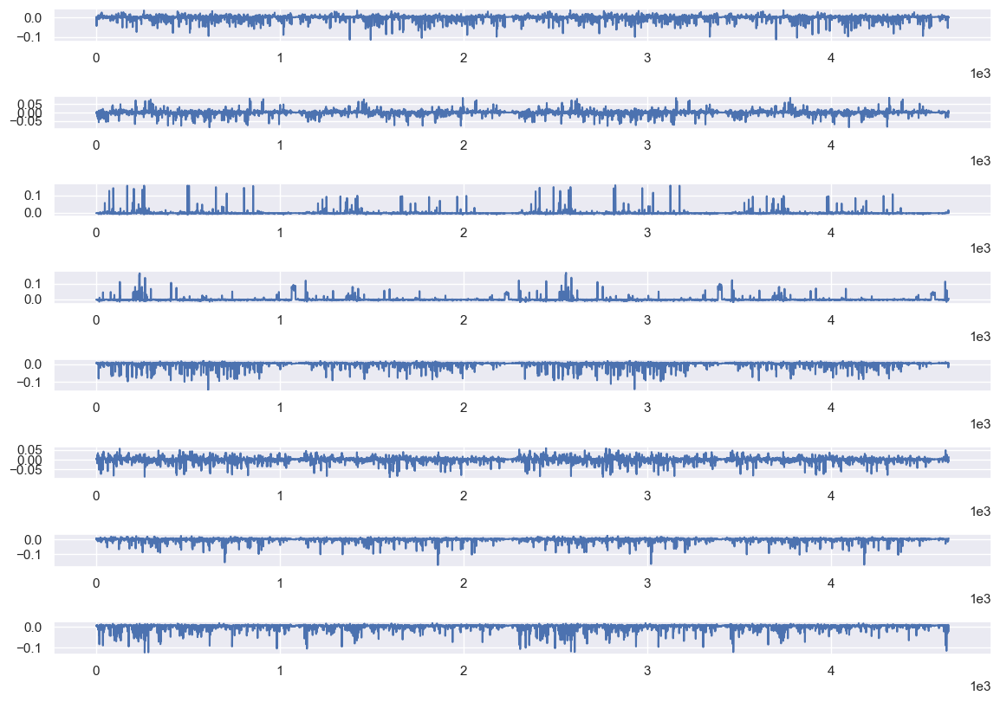

In [50]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
fig = plt.figure()
for i in range(8):
    plt.subplot(8,1,i+1)
    plt.plot(range(np.size(out, axis = 0)), out[:,i])
fig.tight_layout()        
plt.show()

In [36]:
omni_method = "iso"

if omni_method == "iso":
    full_adjs = [
        adj[np.ix_(lp_inds, lp_inds)],
        adj[np.ix_(lp_inds, rp_inds)],
        adj[np.ix_(rp_inds, rp_inds)],
        adj[np.ix_(rp_inds, lp_inds)],
    ]
    out_embed, in_embed = omni(
        full_adjs,
        remove_first=None,
        concat_graphs=False,
        concat_directed=False,
    )

    left_embed = np.concatenate(
        (out_embed[0], out_embed[1], in_embed[0], in_embed[3]), axis=1
    )
    right_embed = np.concatenate(
        (out_embed[2], out_embed[3], in_embed[2], in_embed[1]), axis=1
    )
    omni_iso_embed = np.concatenate((left_embed, right_embed), axis=0)

    svd_embed = svd(omni_iso_embed)

elif omni_method == "color_iso":

    all_sub_adjs = []
    for a in adjs:
        sub_adjs = [
            a[np.ix_(lp_inds, lp_inds)],
            a[np.ix_(lp_inds, rp_inds)],
            a[np.ix_(rp_inds, rp_inds)],
            a[np.ix_(rp_inds, lp_inds)],
        ]
        all_sub_adjs += sub_adjs

    out_embed, in_embed = omni(
        all_sub_adjs,
        remove_first=None,
        concat_graphs=False,
        concat_directed=False,
    )
    color_embeds = []
    for i in range(len(adjs)):
        start = i * 4  
        left_embed = np.concatenate(
            (
                out_embed[0 + start],
                out_embed[1 + start],
                in_embed[0 + start],
                in_embed[3 + start],
            ),
            axis=1,
        )
        right_embed = np.concatenate(
            (
                out_embed[2 + start],
                out_embed[3 + start],
                in_embed[2 + start],
                in_embed[1 + start],
            ),
            axis=1,
        )
        color_embed = np.concatenate((left_embed, right_embed), axis=0)
        color_embeds.append(color_embed)

    omni_color_embed = np.concatenate(color_embeds, axis=1)

    svd_embed = svd(omni_color_embed)
    

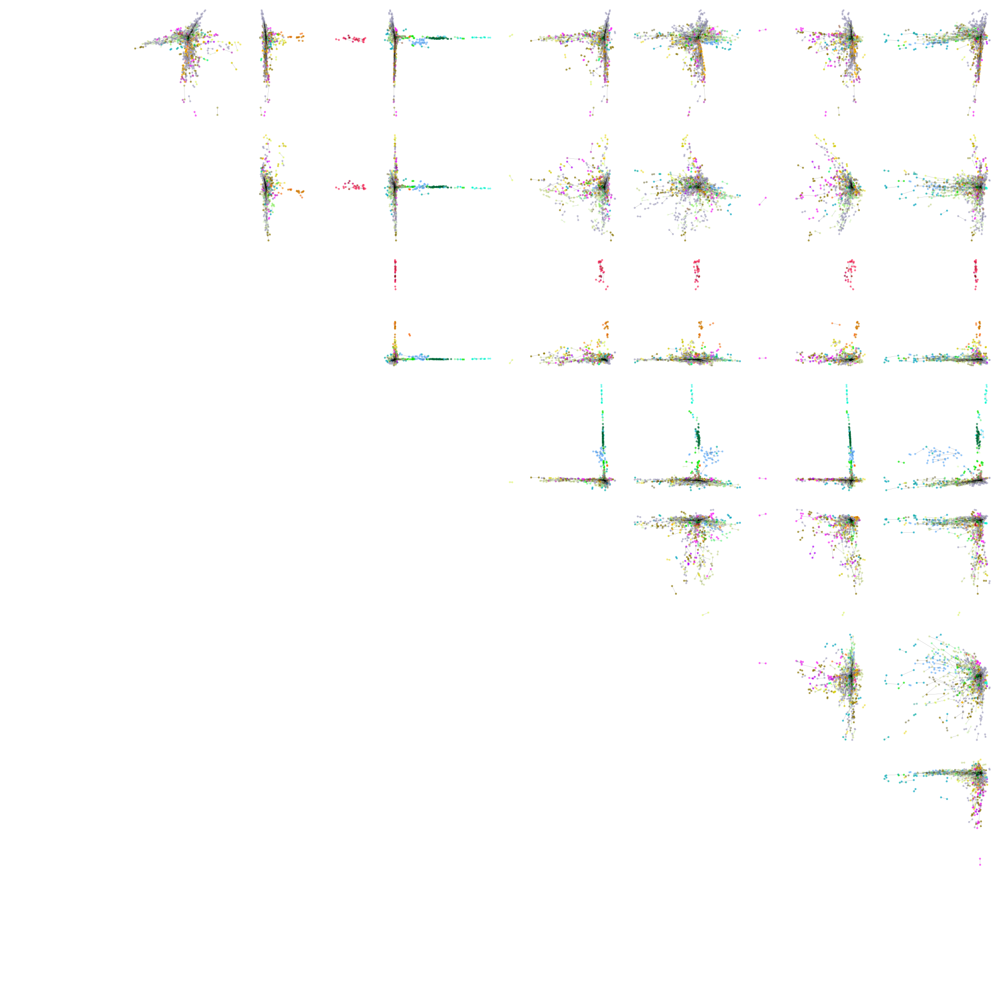

In [54]:
n_pairs = len(lp_inds)
new_lp_inds = np.arange(n_pairs)
new_rp_inds = np.arange(n_pairs) + n_pairs
new_meta = meta.iloc[np.concatenate((lp_inds, rp_inds), axis=0)].copy()
labels = new_meta["merge_class"].values

plot_pairs(
    omni_iso_embed[:, :8], labels, left_pair_inds=new_lp_inds, right_pair_inds=new_rp_inds
)
plt.show()
